To enable interactive plots, run `jupyter labextension install jupyter-matplotlib` followed by:

In [1]:
!jupyter labextension install jupyter-matplotlib

(Deprecated) Installing extensions with the jupyter labextension install command is now deprecated and will be removed in a future major version of JupyterLab.

Users should manage prebuilt extensions with package managers like pip and conda, and extension authors are encouraged to distribute their extensions as prebuilt packages 
c:\users\hp\appdata\local\programs\python\python39\lib\site-packages\jupyterlab\debuglog.py:56: UserWarning: An error occurred.
  warnings.warn("An error occurred.")
c:\users\hp\appdata\local\programs\python\python39\lib\site-packages\jupyterlab\debuglog.py:57: UserWarning: ValueError: Please install Node.js and npm before continuing installation. You may be able to install Node.js from your package manager, from conda, or directly from the Node.js website (https://nodejs.org).
  warnings.warn(msg[-1].strip())
c:\users\hp\appdata\local\programs\python\python39\lib\site-packages\jupyterlab\debuglog.py:58: UserWarning: See the log file for details: C:\Users\HP\

In [2]:
!pip install --upgrade ipympl matplotlib -q
%matplotlib ipympl

You should consider upgrading via the 'c:\users\hp\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [3]:
!pip install hdbscan pymatgen colorcet -q

You should consider upgrading via the 'c:\users\hp\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [3]:
pip install fastai

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\users\hp\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [1]:
import hdbscan
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn import manifold
from ipywidgets import interact, Output
from IPython.display import clear_output
from sklearn import cluster
import sys
sys.path.append('..')
sys.path.append('../autoencoder')

#from src.band_plotters import*
from src.TensorImageNoised import *
from src.cluster_plotters import *
sys.path.append('/notebooks/autoencoder/')
sys.path.append('/notebooks/src/')

from model import *
import model as resnet_autoencoder

from misc import *

%matplotlib inline
#%matplotlib auto

In [2]:
#sys.path

# Enter Full Fingerprint Name - Specify Configuration Below
Note perplexity can be changed for second tsne run - see configuration. See `fingerprints` folder to view possible `FINGERPRINT_NAME`'s.

In [3]:
FINGERPRINT_NAME = "224_2channel_resnet_L=98_perplexity_30_length_98_CORRECTED"

# Functions to View Materials/Clusters

For any fingerprint

In [4]:
def view_material_any(index, show_inp=False):
    fig, ax = plt.subplots()
    ax.plot(np.linspace(0, fp_dict["length"], fp_dict["length"]), df.loc[index][fingerprint_cols])
    ax.set_xlabel(index)
    ax.set_title("fingerprint")
    plt.show()
    
    if show_inp:
        image = Image.open(DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{index}.png")
        image.show()

For an autoencoder based fingerprint

In [5]:
def show_tensor_image(tensor, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    ax.imshow(tensor.permute(1, 2,0).detach().numpy(), vmax=1, vmin=0)
    return ax

def view_material_ae_2_channel(index, inp_recon_together=False):
    view_material_any(index)
        
    print(df.loc[index]["member_strength"])

    image_filename = DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{index}.png"

    if learn:
        # Get input and prediction
        _, out, _ = learn.predict(image_filename)


        # 2 channel image
        dl = learn.dls.test_dl([image_filename])

        with torch.no_grad():
            inp = dl.one_batch()[0]
            fingerprint_2_channel = learn.model.encoder(inp)

        fingerprint_2_channel = fingerprint_2_channel[0]
        fingerprint_2_channel /= 3.982462167739868 # max activation in fingerprint array
        rgb_image = torch.stack([fingerprint_2_channel[0, :, :], torch.zeros_like(fingerprint_2_channel[0, :, :]), fingerprint_2_channel[1, :, :]], dim=0)
        show_tensor_image(rgb_image)

        ax = None
        if inp_recon_together:
            fig, ax = plt.subplots(2, 1)

        show_tensor_image(inp[0], ax)
        show_tensor_image(torch.sigmoid(out), ax)
        plt.show()
    else:
        print(f"Model not loaded, displaying bandstructure of {index}:")
        show_image(load_image(image_filename))


In [6]:
def view_cluster(label):
    display(df[df.labels==label].drop(BORING_COLUMNS, axis=1).head(200))

    num_plots = len(df[df.labels==label])

    #fig, ax = plt.subplots(num_plots, 1, figsize=(4, 1*num_plots))

    for i, index in enumerate(df[df.labels==label].index):
        view_material_function(index)

# Fingerprint Configurations

In [7]:
FINGERPRINTS = {
    "224_2channel_resnet_L=98_perplexity_30_length_98_CORRECTED":{
    "hdbscan":{"min_cluster_size":5, "min_samples":2},
    "tsne":{"perplexity":10, "early_exaggeration":12.0, "learning_rate":"auto"},
    "length":98,
    "model": "../autoencoder/trained_models/resnet18_size224_lossbce_channels2.pkl",
    "view_func":view_material_ae_2_channel
    },
    
    "all_k_branches_histogram_-8_to_8_perplexity_30_length_60":{
    "hdbscan":{"min_cluster_size":4, "min_samples":3},
    "tsne":{"perplexity":30, "early_exaggeration":12.0, "learning_rate":"auto"},
    "length":60,
    "model":False,
    "view_func":lambda mat_id: view_material_any(mat_id, True) 
    }
    
}

fp_dict = FINGERPRINTS[FINGERPRINT_NAME]
hdbscan_dict = fp_dict["hdbscan"]
tsne_dict = fp_dict["tsne"]
length = fp_dict["length"]
view_material_function = fp_dict["view_func"]


FLAT_ONLY = True
BORING_COLUMNS = ["flat_segments", "flatness_score", "binary_flatness", "horz_flat_seg", "exfoliation_eg", "A", "B", "C", "D", "E", "F"]
INPUT_NAME = FINGERPRINT_NAME + ".csv"

In [8]:
try:
    if fp_dict["model"]:
        learn = load_learner(fp_dict["model"])
except:
    learn = None
    print("Model not found")

Model not found


# Load Data

In [9]:
df = pd.read_csv(f"../fingerprints/{INPUT_NAME}", index_col="ID")
if FLAT_ONLY:
    df = df[df.horz_flat_seg>0]
df.head()

,formula,gen_formula,space_group,segments,flat_segments,flatness_score,discovery,binary_flatness,horz_flat_seg,exfoliation_eg,...,90,91,92,93,94,95,96,97,fx,fy
ID,,,,,,,,,,,,,,,,,,,,,
2dm-21,TaI3,AB3,162,3,3,0.99081,bottom-up,1,1,0.097255,...,2.226489,2.289640,2.589102,2.477097,2.594307,2.217409,2.636327,2.281451,-85.320190,19.231680
2dm-22,Li2O,AB2,164,3,3,0.98399,bottom-up,1,4,0.037593,...,2.502424,1.772349,1.775590,1.941162,1.745729,1.716548,1.714002,1.817789,74.049220,-91.258260
2dm-25,VBr4,AB4,123,3,3,1.00000,bottom-up,1,2,0.140290,...,2.372130,2.224227,2.399812,2.197275,2.769758,2.584419,2.809708,2.114330,36.688946,55.726463
2dm-29,SBr,AB,2,4,4,0.99835,bottom-up,1,3,0.067035,...,2.852715,2.168420,2.470804,2.357963,2.278249,2.280239,2.296243,2.235125,11.995536,-106.832634
2dm-31,AlF3,AB3,12,3,3,0.97429,bottom-up,1,3,NaN,...,2.323418,2.470922,2.311524,2.188995,2.469880,2.198094,2.495989,2.491156,190.981610,14.114123


# Cluster

In [10]:
fingerprint_cols = [str(i) for i in range(length)]
BORING_COLUMNS += fingerprint_cols

In [11]:
clusterer = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, approx_min_span_tree=True,\
gen_min_span_tree=True, leaf_size=40, metric='minkowski', cluster_selection_method='leaf', min_cluster_size=hdbscan_dict["min_cluster_size"], min_samples=hdbscan_dict["min_samples"], p=0.2)

clusterer.fit(df[fingerprint_cols])

df["labels"] = clusterer.labels_
df["membership_strength"] = clusterer.probabilities_

In [12]:
#### save tree for plotting using Pycharm
cond_tree = clusterer.condensed_tree_
print(cond_tree)
panda_data = cond_tree.to_pandas()
selected_clusters=cond_tree._select_clusters()
clusters_df = pd.DataFrame({'clusters':selected_clusters})
print(panda_data.head(10))
#panda_data = panda_data.rename(columns={'': 'ID'})
print(selected_clusters)
print(df.labels)
### Write trees to excel for plot using ETE3 on PyCharm
# with pd.ExcelWriter('tree_HBDSCAN_5_2.xlsx') as writer:
#     panda_data.to_excel(writer,sheet_name='tree')
#     clusters_df.to_excel(writer,sheet_name='clusters')

   parent  child  lambda_val  child_size
0    2140   1029    0.126323           1
1    2140   2105    0.135182           1
2    2140    884    0.155780           1
3    2140    632    0.171817           1
4    2140    154    0.173524           1
5    2140   1025    0.185848           1
6    2140   1035    0.190575           1
7    2140   1034    0.191190           1
8    2140    968    0.193067           1
9    2140   1081    0.195523           1
[2229, 2230, 2235, 2236, 2237, 2238, 2232, 2226, 2224, 2222, 2220, 2218, 2216, 2214, 2212, 2210, 2201, 2202, 2196, 2192, 2188, 2186, 2189, 2190, 2182, 2176, 2170, 2179, 2207, 2208, 2206, 2204, 2197, 2198, 2178, 2174, 2172, 2166, 2164, 2162, 2160, 2158, 2156, 2154, 2152, 2150, 2148, 2146, 2144, 2142]
ID
2dm-21      -1
2dm-22      -1
2dm-25       3
2dm-29      -1
2dm-31      33
            ..
2dm-6447    -1
2dm-6449    -1
2dm-6450    -1
2dm-6451    -1
2dm-6458    -1
Name: labels, Length: 2140, dtype: int64


# View Clusters

In [13]:
# %matplotlib inline
for i in np.unique(df['labels'].to_numpy()):
    print(f"cluster_ID: {i}, cluster_size:{len(df[df['labels']==i])}")
#interact(view_cluster, label=(-1, len(np.unique(df.labels))-2, 1))

cluster_ID: -1, cluster_size:1662
cluster_ID: 0, cluster_size:6
cluster_ID: 1, cluster_size:5
cluster_ID: 2, cluster_size:6
cluster_ID: 3, cluster_size:7
cluster_ID: 4, cluster_size:5
cluster_ID: 5, cluster_size:8
cluster_ID: 6, cluster_size:6
cluster_ID: 7, cluster_size:5
cluster_ID: 8, cluster_size:6
cluster_ID: 9, cluster_size:5
cluster_ID: 10, cluster_size:5
cluster_ID: 11, cluster_size:6
cluster_ID: 12, cluster_size:5
cluster_ID: 13, cluster_size:6
cluster_ID: 14, cluster_size:7
cluster_ID: 15, cluster_size:9
cluster_ID: 16, cluster_size:5
cluster_ID: 17, cluster_size:17
cluster_ID: 18, cluster_size:8
cluster_ID: 19, cluster_size:5
cluster_ID: 20, cluster_size:7
cluster_ID: 21, cluster_size:5
cluster_ID: 22, cluster_size:39
cluster_ID: 23, cluster_size:16
cluster_ID: 24, cluster_size:7
cluster_ID: 25, cluster_size:10
cluster_ID: 26, cluster_size:13
cluster_ID: 27, cluster_size:13
cluster_ID: 28, cluster_size:8
cluster_ID: 29, cluster_size:9
cluster_ID: 30, cluster_size:5
cluster_I

### ETE3 tree  (does not work on jupyter)

In [14]:
# cond_tree = clusterer.condensed_tree_
# cond_tree.plot()
# ################################## 
# ###### Pandas data
# ##################################
# panda_data=cond_tree.to_pandas()
# #print(G.number_of_nodes())
# #print(panda_data)
# selected_clusters=cond_tree._select_clusters()
# G1 = panda_data[panda_data['child_size'] > 1]
# #New_Nx=nx.from_pandas_edgelist(G1,'parent','child',['lambda_val', 'child_size'])
# #nx.write_edgelist(New_Nx,'New_edgelist', encoding = 'latin-1')
# ################################
# ################### To list from pandas
# len_G1=[]
# cluster_id=[]
# for ind1 in G1.index:
#     len_G1.append(0.1)
#     if G1.at[ind1,'child'] in selected_clusters:
#         cluster_id.append(str(selected_clusters.index(G1.at[ind1,'child'])))
#     else:
#         cluster_id.append('-1')
# print(cluster_id)
# G1.insert(4, 'dist_G1', len_G1)
# G1.insert(5, 'cluster_id', cluster_id)
# G2=G1.copy()
# print(G2)
# del G1['cluster_id']
# del G1['lambda_val']
# del G1['child_size']
# g1_list=G1.values.tolist()
# ##############################
# ################ ETE treee from parent child relations
# import PyQt5
# from ete3 import *
# tree = Tree.from_parent_child_table(g1_list)
# #tree.write(format=9,outfile='new_tree.nw')
# print(G2)
# for node in tree.traverse():
#     nstyle = NodeStyle()
#     if node.is_leaf():
#         index1=G2.index[G2['child'] == int(node.name)]
#         node.name=G2.at[index1[0],'cluster_id']
#         #nstyle = NodeStyle()
#         #print(int(node.name))
#         #print(matplotlib.colors.rgb2hex(cmap(norm(int(node.name)))))
#         nstyle["fgcolor"] = str(matplotlib.colors.rgb2hex(cmap(norm(int(node.name)))))
#         #nstyle['fgcolor']='#FF0000'
#         nstyle["size"] = G2.at[index1[0],'child_size']/2
#     else:
#         nstyle["fgcolor"] ='black'
#     node.set_style(nstyle)
# tree.write(format=1,outfile='new_tree.nw')
# #################################
# ################### Plot
# ts = TreeStyle()
# ts.mode='c'
# ts.arc_start = -180 # 0 degrees = 3 o'clock
# ts.arc_span = 360
# ts.scale = 40
# ts.show_leaf_name=True
# tree.show(tree_style=ts)
# tree.render(fname+"_tree.png", w=400, tree_style=ts)

In [15]:
# #New_Nx=nx.from_pandas_edgelist(G1,'parent','child',['lambda_val', 'child_size'])
# #nx.write_edgelist(New_Nx,'New_edgelist', encoding = 'latin-1')
# ################################
# ################### To list from pandas
# len_G1=[]
# cluster_id=[]
# for ind1 in G1.index:
#     len_G1.append(0.1)
#     if G1.at[ind1,'child'] in selected_clusters:
#         cluster_id.append(str(selected_clusters.index(G1.at[ind1,'child'])))
#     else:
#         cluster_id.append('-1')
# print(cluster_id)
# G1.insert(4, 'dist_G1', len_G1)
# G1.insert(5, 'cluster_id', cluster_id)
# G2=G1.copy()
# print(G2)
# del G1['cluster_id']
# del G1['lambda_val']
# del G1['child_size']
# g1_list=G1.values.tolist()

In [16]:
# ##############################
# ################ ETE tree from parent child relations

# tree = Tree.from_parent_child_table(g1_list)
# #tree.write(format=9,outfile='new_tree.nw')
# print(G2)
# for node in tree.traverse():
#     nstyle = NodeStyle()
#     if node.is_leaf():
#         index1=G2.index[G2['child'] == int(node.name)]
#         node.name=G2.at[index1[0],'cluster_id']
#         #nstyle = NodeStyle()
#         #print(int(node.name))
#         #print(matplotlib.colors.rgb2hex(cmap(norm(int(node.name)))))
#         nstyle["fgcolor"] = str(matplotlib.colors.rgb2hex(cmap(norm(int(node.name)))))
#         #nstyle['fgcolor']='#FF0000'
#         nstyle["size"] = G2.at[index1[0],'child_size']/2
#     else:
#         nstyle["fgcolor"] ='black'
#     node.set_style(nstyle)
# tree.write(format=1,outfile='new_tree.nw')
# #################################
# ################### Plot
# ts = TreeStyle()
# ts.mode= 'r'
# ts.arc_start = 180   # 0 degrees = 3 o'clock
# ts.arc_span = 360
# ts.scale = 40
# #ts.show_leaf_name=True
# tree.show(tree_style=ts)
# # t = Tree()
# # t.populate(20)
# t.render(file_name="%%inline", w=400, tree_style=ts) 
# t = Tree( "((a,b),c);" )
# t.show()

# Run TSNE and plot (with draggable labels)

In [38]:
if FLAT_ONLY:
    # tsne = manifold.TSNE(n_components=2, early_exaggeration=12.0, init="pca",learning_rate="auto", random_state=0, perplexity=10,n_iter=10000, verbose=2, metric="minkowski")
    tsne = manifold.TSNE(n_components=2, early_exaggeration=500, init="pca",learning_rate=tsne_dict["learning_rate"], random_state=0, perplexity=tsne_dict["perplexity"],n_iter=10000, verbose=2)
    fingerprint_2d = tsne.fit_transform(df[fingerprint_cols])
    df.fx, df.fy = fingerprint_2d[:, 0], fingerprint_2d[:, 1]

c:\users\hp\appdata\local\programs\python\python39\lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 2140 samples in 0.001s...
[t-SNE] Computed neighbors for 2140 samples in 0.024s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2140
[t-SNE] Computed conditional probabilities for sample 2000 / 2140
[t-SNE] Computed conditional probabilities for sample 2140 / 2140
[t-SNE] Mean sigma: 1.016388
[t-SNE] Computed conditional probabilities in 0.018s
[t-SNE] Iteration 50: error = 6284.8227539, gradient norm = 4.3462791 (50 iterations in 0.723s)
[t-SNE] Iteration 100: error = 6351.8076172, gradient norm = 4.2957106 (50 iterations in 0.743s)
[t-SNE] Iteration 150: error = 6337.9106445, gradient norm = 4.3172770 (50 iterations in 0.761s)
[t-SNE] Iteration 200: error = 6329.8554688, gradient norm = 4.0270376 (50 iterations in 0.717s)
[t-SNE] Iteration 250: error = 6349.4658203, gradient norm = 4.0330758 (50 iterations in 0.857s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 6349.465820
[t-SNE] Iterati

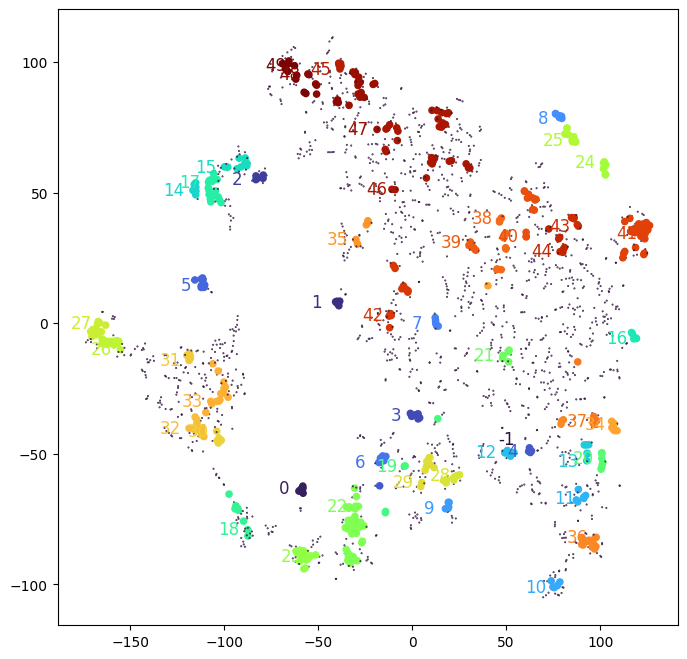

In [37]:
%matplotlib inline
labels = clusterer.labels_

fig = plt.figure(figsize=(8,8))
size=np.ones((len(labels),1))*20
size[labels==-1]=0.2
 
unique_label,cluster_rep_index, counts = np.unique(labels, return_index=True, return_counts=True)
cmap = plt.get_cmap('turbo')
norm = matplotlib.colors.Normalize(vmin=min(labels), vmax=max(labels))
    
for rep_id in cluster_rep_index:
        col=cmap(norm(labels[rep_id]))
        plt.annotate(labels[rep_id],fingerprint_2d[rep_id,:]+[-10,0],color=col,alpha=1, weight='normal', ha='center', va='center', size=12).draggable()

plt.scatter(fingerprint_2d[:,0], fingerprint_2d[:,1],s=size, c=labels*5, cmap="turbo")
plt.show()
#df.to_excel("df_fingerprints_and_final_labels_after_tSNE.xlsx")




# UMAP

In [22]:
pip install umap-learn

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\users\hp\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [ ]:
!pip install scipy==1.12.0

In [23]:
import umap

# Create a UMAP model
umap_model = umap.UMAP(n_components=2, random_state=42, metric="minkowski", min_dist=0.0, n_neighbors=20)

# Fit and transform the data
fingerprint_umap = umap_model.fit_transform(df[fingerprint_cols])

# Assign the UMAP coordinates to the DataFrame
df['umap_x'], df['umap_y'] = fingerprint_umap[:, 0], fingerprint_umap[:, 1]

c:\users\hp\appdata\local\programs\python\python39\lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


C:\Users\HP\AppData\Local\Temp\ipykernel_19128\321512577.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('turbo')


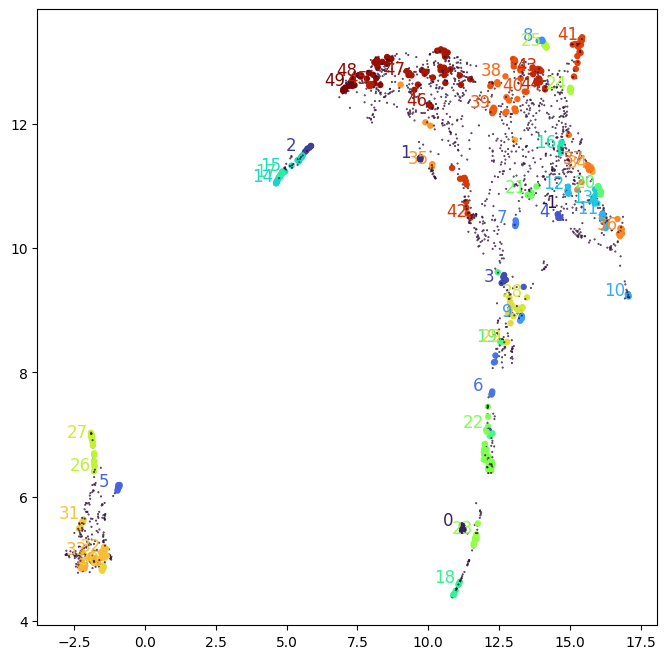

In [32]:
labels = clusterer.labels_


fig = plt.figure(figsize=(8, 8))
size = np.ones((len(labels), 1)) * 13
size[labels == -1] = 0.2

unique_label, cluster_rep_index, counts = np.unique(labels, return_index=True, return_counts=True)
cmap = plt.cm.get_cmap('turbo')
norm = matplotlib.colors.Normalize(vmin=min(labels), vmax=max(labels))

#df[df['umap_x'].to_numpy()<=0] = df[df['umap_x'].to_numpy()<=0]*-2
#df[df['umap_y'].to_numpy()<=0] = df[df['umap_y'].to_numpy()<=0]*-1
plt.scatter(df['umap_x'], df['umap_y'], s=size, c=labels * 5, cmap="turbo")

# Assuming fingerprint_2d is replaced by UMAP coordinates 'umap_x' and 'umap_y'
for rep_id in cluster_rep_index:
    col = cmap(norm(labels[rep_id]))
    plt.annotate(labels[rep_id], df[['umap_x', 'umap_y']].values[rep_id, :] + [-0.5, 0.1],
                 color=col, alpha=1, weight='normal', ha='center', va='center', size=12).draggable()

plt.show()

# DBSCAN over T-SNE

In [28]:
A=pd.read_excel('df_fingerprints_and_final_labels_after_tSNE.xlsx',usecols=[1,2,3,4,5,6,7,8,9,10,125,126,127,128])

/tmp/ipykernel_189339/2517945370.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('turbo')


(-139.31516075134277,
 190.92548942565918,
 -119.07871932983399,
 115.18655319213869)

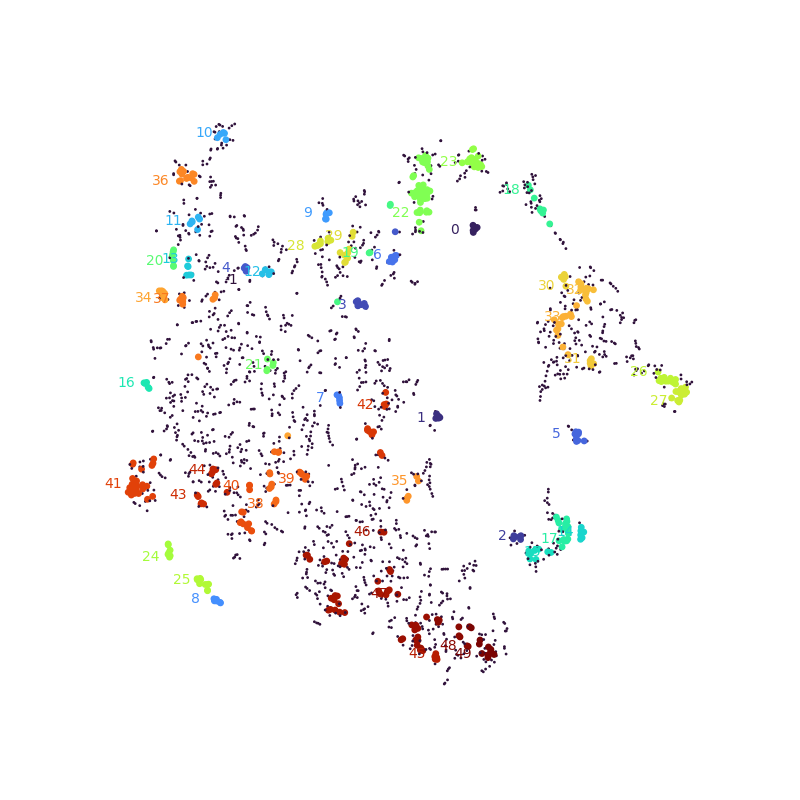

In [29]:
labels = A['labels']
fingerprint_2d = A[['fx','fy']].to_numpy()

%matplotlib ipympl

fig = plt.figure(figsize=(8,8))
size=np.ones((len(labels),1))*15*1
size[labels==-1]=1

unique_label,cluster_rep_index, counts = np.unique(labels, return_index=True, return_counts=True)
cmap = plt.cm.get_cmap('turbo')
norm = matplotlib.colors.Normalize(vmin=min(labels), vmax=max(labels))

for i,rep_id in enumerate(cluster_rep_index):
        col=cmap(norm(labels[rep_id]))
        shift = [-10,0]
        plt.annotate(labels[rep_id],fingerprint_2d[rep_id,:]+shift,color=col,alpha=1, weight='normal', ha='center', va='center', size=10).draggable()
plt.scatter(fingerprint_2d[:,0], fingerprint_2d[:,1],s=size, c=labels*5, cmap="turbo")

plt.axis('off')
#plt.savefig("test_ML_print.png", bbox_inches='tight')


In [30]:
new_A=A[labels!=-1]
fingerprint_2d_new = new_A[['fx','fy']].to_numpy()
dbscan_ins = cluster.DBSCAN(eps=25, min_samples=12, metric='euclidean')
dbscan_ins.fit(fingerprint_2d_new)

DBSCAN(eps=25, min_samples=12)

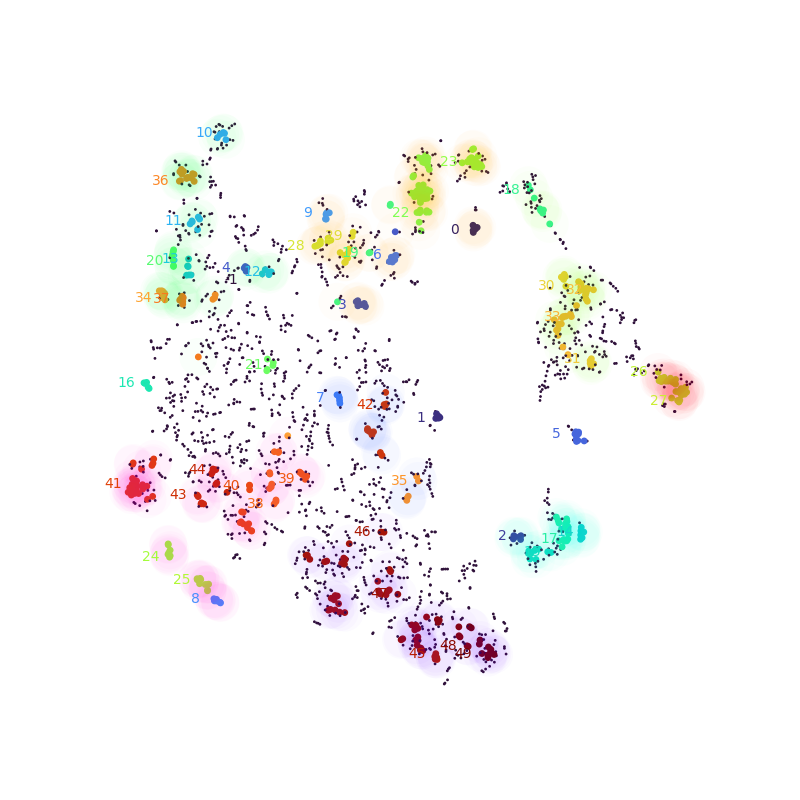

In [31]:
newlabels = dbscan_ins.labels_
#print(newlabels.shape)
%matplotlib ipympl

fig = plt.figure(figsize=(8,8))
size_new=np.ones((len(newlabels),1))*15*50
size_new[newlabels==-1]=1


#unique_label,cluster_rep_index, counts = np.unique(newlabels, return_index=True, return_counts=True)
#cmap = plt.cm.get_cmap('plasma')
norm_new = matplotlib.colors.Normalize(vmin=min(labels), vmax=max(labels))

for i,rep_id in enumerate(cluster_rep_index):
        col=cmap(norm(labels[rep_id]))
        shift = [-10,0]
        plt.annotate(labels[rep_id],fingerprint_2d[rep_id,:]+shift,color=col,alpha=1, weight='normal', ha='center', va='center', size=10).draggable()
plt.scatter(fingerprint_2d[:,0], fingerprint_2d[:,1],s=size, c=labels*5, cmap="turbo")
plt.scatter(fingerprint_2d_new[:,0], fingerprint_2d_new[:,1],s=size_new, c=newlabels*5, cmap="hsv", alpha=0.02, linewidths=0)

plt.axis('off')
plt.show()

In [24]:
# plt.savefig("../../../../../paper_plots/test_ML_print_HDBSCAN_5-2_TSNE_10_DBSCAN_25.png", dpi = 500, bbox_inches='tight')
# plt.savefig("../../../../../paper_plots/test_ML_print_HDBSCAN_5-2_TSNE_10_DBSCAN_25.svg", dpi = 500, bbox_inches='tight')

# View Groups Simulataneously With Clusters
Click on a point to it's cluster number, fingerprint, band structure and reconstruction if applicable.

Output()

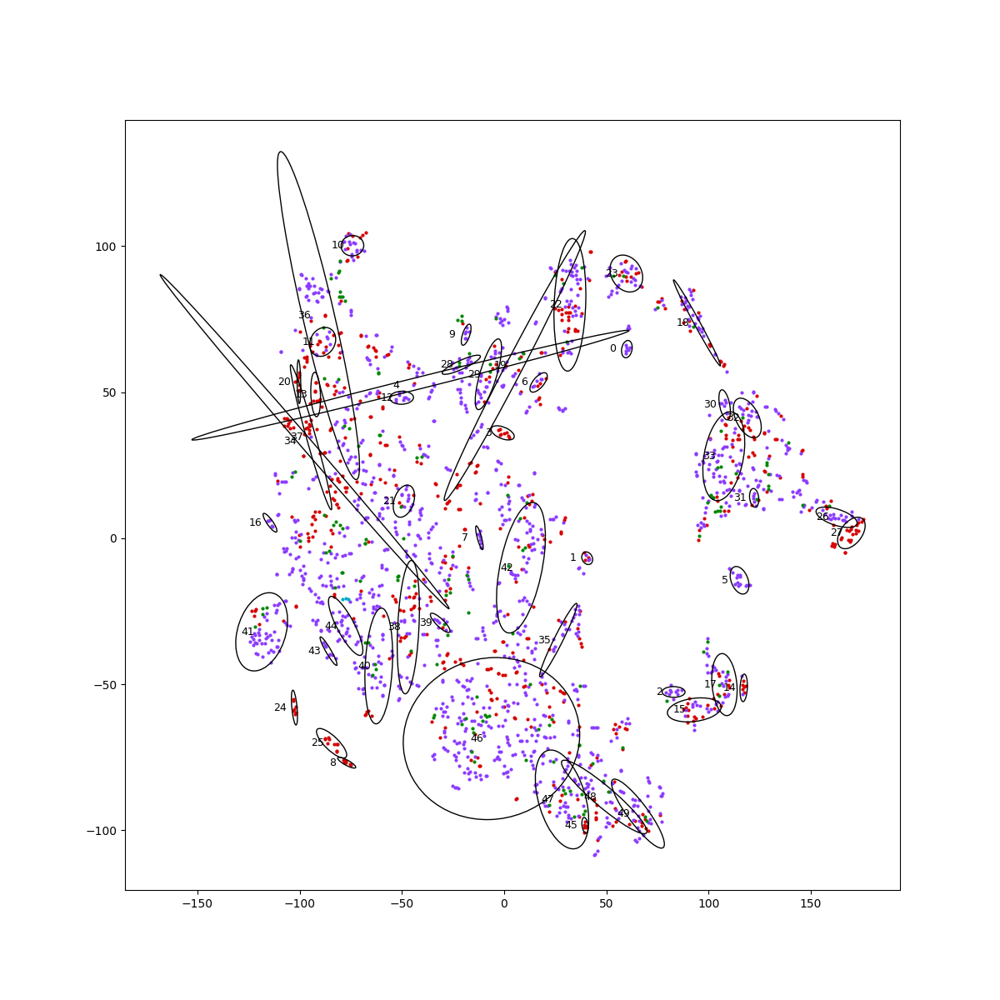

In [32]:
# change to ipympl for interactive plot (ie so you can click on materials)

%matplotlib inline 
group = "segments" # of k-branches

%matplotlib ipympl
out = Output()

@out.capture()
def onclick(event):
    clear_output()
    closest = np.sqrt((event.xdata-df.fx)**2 + (event.ydata-df.fy)**2).idxmin()
    label = df.labels.loc[closest]
    print(f"Clicked on material {closest} in cluster {label}")
    # display(df[df.labels == label].drop(BORING_COLUMNS, axis=1))
    plt.close()
    %matplotlib inline
    view_material_function(closest)
display(out)

fig, ax = plt.subplots(figsize=(12, 12))
ax = plot_groups(df, group, ax=ax)
ax = plot_cluster_ellipses(df, ax=ax, color="black")
fig.canvas.mpl_connect('button_press_event', onclick)

plt.show()

# Output table of all clusters with chemical formulae (+ exemplar material band structures for machine learned print)

In [45]:
from pandas.plotting import table

In [46]:
df.formula[1]
def round_(number):
    return round(number, 5)
df["membership_strength"] = df.membership_strength.apply(round_)

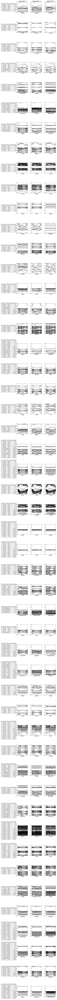

In [62]:
sorted_cluster_df = df[df.labels!=-1].sort_values(by=['labels','membership_strength'], ascending=[True, False])

N_clusters = len(np.unique(clusterer.labels_))-1
#N_clusters = 6

num_bands = 3
fig, axs = plt.subplots(N_clusters, num_bands+1, figsize=(10,3.5*N_clusters))

# for machine learned print
for i in range(1,num_bands+1):
    axs[0, i].set_title('exemplar_{0}'.format(i))

for i in range(0, N_clusters):
    df_part1 = sorted_cluster_df[sorted_cluster_df.labels==i][["formula", "membership_strength"]]
    # max table size of 15
    if(len(df_part1)>=15):
        df_part1 = df_part1.head(15)
    #print(df_part1.index)
    #axs[i, 0].set_title('Cluster_ID={0}'.format(i), y=0.95)
    axs[i, 0].axis("off")
    
    # add band structures for the machine learned fingerprint tables
    # plot the input bands:
    DATA_DIRECTORY=Path("../..")
    input_bands_1 = Image.open(DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{df_part1.index[0]}.png")
    input_bands_2 = Image.open(DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{df_part1.index[1]}.png")
    input_bands_3 = Image.open(DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{df_part1.index[2]}.png")

    axs[i,1].imshow(input_bands_1, extent=[-2, 2, -2, 2], aspect=1)
    axs[i,2].imshow(input_bands_2, extent=[-2, 2, -2, 2], aspect=1)
    axs[i,3].imshow(input_bands_3, extent=[-2, 2, -2, 2], aspect=1)
    
    #axs[i, 0].set_position([0.0, 0.0, 0.25, 0.25])
    for j in range(0, num_bands+1):
        #axs[i, 0].set_position([0.0, 0.0, 0.5, 0.5])
        axs[i, j].set_xlabel(df_part1.formula[j])
        axs[i,j].tick_params(axis='x', which='both',bottom=False,top=False,labelbottom=False)
    
    df_part1_with_index_label = df_part1.rename_axis('Cluster_ID={0}'.format(i)).reset_index()
    table = axs[i, 0].table(df_part1_with_index_label.values, colLabels=df_part1_with_index_label.columns, colWidths= [0.35,0.3,0.5], loc="center")
    table.auto_set_font_size(False)
    table.set_fontsize(7)  # Adjust font size as needed
    table.scale(1.3, 1.3)  # Scale up the table size

plt.rcParams.update({'font.size': 15})
fig.tight_layout()    
plt.subplots_adjust(wspace=0.4)   
#plt.savefig("corrected_alpha_1.0_MCS_5_MS_2_clusters_big_table.png")
#plt.show()

In [36]:
plt.savefig("../../../../../paper_plots/New_alpha_1.0_MCS_5_MS_2_clusters_2127_Materials.png")

#### Plot bandstructures of required clusters

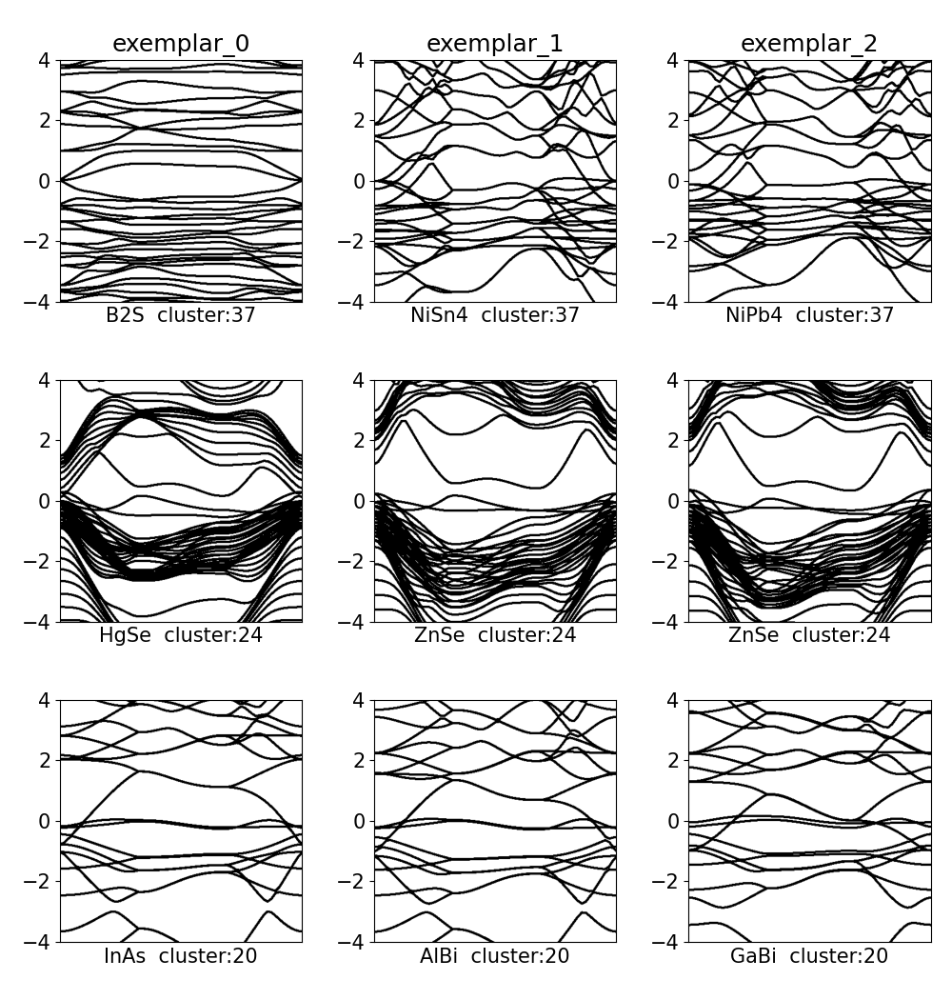

In [59]:
sorted_cluster_df = df[df.labels!=-1].sort_values(by=['labels','membership_strength'], ascending=[True, False])

N_clusters = len(np.unique(clusterer.labels_))-1
#N_clusters = 6
required_clusters = [37, 24,20]
num_bands = 2
fig, axs = plt.subplots(len(required_clusters), num_bands+1, figsize=(10,3.5*len(required_clusters)))

# for machine learned print
for i in range(0,num_bands+1):
    axs[0, i].set_title('exemplar_{0}'.format(i))

for i in range(0,len(required_clusters)):
#    if i in [16 , 24, 30]:
    df_part1 = sorted_cluster_df[sorted_cluster_df.labels==required_clusters[i]][["formula", "membership_strength"]]
    # max table size of 15
    if(len(df_part1)>=15):
        df_part1 = df_part1.head(15)
    #print(df_part1.index)
    #axs[i, 0].set_title('Cluster_ID={0}'.format(i), y=0.95)
    #axs[i, 0].axis("off")
    
    # add band structures for the machine learned fingerprint tables
    # plot the input bands:
    DATA_DIRECTORY=Path("../..")
    input_bands_1 = Image.open(DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{df_part1.index[-1]}.png")
    input_bands_2 = Image.open(DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{df_part1.index[0]}.png")
    input_bands_3 = Image.open(DATA_DIRECTORY/f"images/grayscale_4ev_linewidth3/{df_part1.index[1]}.png")

    axs[i,0].imshow(input_bands_1, extent=[-4, 4, -4, 4], aspect=1)
    axs[i,1].imshow(input_bands_2, extent=[-4, 4, -4, 4], aspect=1)
    axs[i,2].imshow(input_bands_3, extent=[-4, 4, -4, 4], aspect=1)
    
    #axs[i, 0].set_position([0.0, 0.0, 0.25, 0.25])
    for j in range(0, num_bands+1):
        #axs[i, 0].set_position([0.0, 0.0, 0.5, 0.5])
        axs[i, j].set_xlabel(df_part1.formula[j-1]+'  cluster:'+str(required_clusters[i]) )
        axs[i, j].set_yticks([-4,-2,0,2,4])
        axs[i,j].tick_params(axis='x', which='both',bottom=False,top=False,labelbottom=False)
    
    df_part1_with_index_label = df_part1.rename_axis('Cluster_ID={0}'.format(i)).reset_index()
    # table = axs[i, 0].table(df_part1_with_index_label.values, colLabels=df_part1_with_index_label.columns, colWidths= [0.4,0.3,0.6], loc="center")
    # table.auto_set_font_size(False)
    # table.set_fontsize(8)  # Adjust font size as needed
    # table.scale(1.3, 1.3)  # Scale up the table size
plt.rcParams.update({'font.size': 15})
fig.tight_layout()    
plt.subplots_adjust(wspace=0.3)   
#plt.savefig("corrected_alpha_1.0_MCS_5_MS_2_clusters_big_table.png")
#plt.show()

In [60]:
plt.savefig(f"../../../../../paper_plots/Cluster_{required_clusters}_HgSe.png",dpi=400)

# 2D HISTOGRAM FOR HDBSCAN PARAMETER OPTIMISATION

In [11]:
# iterate over hdbscan parameter values
MS_vals = np.arange(2,12,1)
MCS_vals = np.arange(2,12,1)

DBCV_vals = np.zeros((len(MS_vals),len(MCS_vals)))
N_cluster_vals = np.zeros((len(MS_vals),len(MCS_vals)))
N_uncluster_vals = np.zeros((len(MS_vals),len(MCS_vals)))

for i,MS in enumerate(MS_vals):
    for j,MCS in enumerate(MCS_vals):
        clusterer_HDB = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, approx_min_span_tree=True,\
                                gen_min_span_tree=True, leaf_size=40, metric='minkowski', cluster_selection_method='leaf', min_cluster_size=MCS, min_samples=MS, p=0.2)
        #clusterer.fit(30*np.tanh(df[fingerprint_cols])/30)
        clusterer_HDB.fit(df[fingerprint_cols])

        df["labels"] = clusterer_HDB.labels_
        
        DBCV_vals[-(j+1),i] = clusterer_HDB.relative_validity_ 
        N_cluster_vals[-(j+1),i] = len(np.unique(clusterer_HDB.labels_))-1
        N_uncluster_vals[-(j+1),i] = len(df[df["labels"]==-1])



In [12]:
print(N_cluster_vals)
print(N_uncluster_vals)
print(DBCV_vals)

[[ 17.  11.  10.   9.   5.   9.   6.   5.   5.   5.]
 [ 18.  15.  11.   9.   6.   9.   7.   6.   5.   5.]
 [ 19.  16.  11.  12.   8.   9.   8.   7.   6.   5.]
 [ 24.  18.  14.  12.   8.   9.   9.   8.   6.   5.]
 [ 29.  18.  18.  12.  11.  10.  11.   9.   7.   7.]
 [ 35.  23.  21.  16.  13.  11.  11.   9.  10.   7.]
 [ 50.  33.  27.  18.  13.  13.  12.  11.  11.   8.]
 [ 78.  51.  35.  20.  13.  13.  13.  11.  11.  11.]
 [109.  63.  39.  30.  19.  14.  14.  11.  12.  13.]
 [165.  92.  56.  45.  31.  21.  20.  17.  17.  16.]]
[[1826. 1828. 1879. 1934. 1846. 1893. 1879. 1885. 1875. 1886.]
 [1816. 1805. 1869. 1934. 1875. 1893. 1934. 1875. 1875. 1886.]
 [1807. 1823. 1869. 1932. 1857. 1893. 1925. 1866. 1866. 1886.]
 [1787. 1880. 1845. 1932. 1857. 1893. 1917. 1858. 1866. 1886.]
 [1752. 1880. 1846. 1932. 1944. 1886. 1937. 1916. 1859. 1872.]
 [1716. 1850. 1828. 1908. 1958. 1917. 1937. 1916. 1947. 1872.]
 [1662. 1806. 1873. 1898. 1958. 1936. 1932. 1954. 1960. 1933.]
 [1597. 1760. 1856. 1890. 19

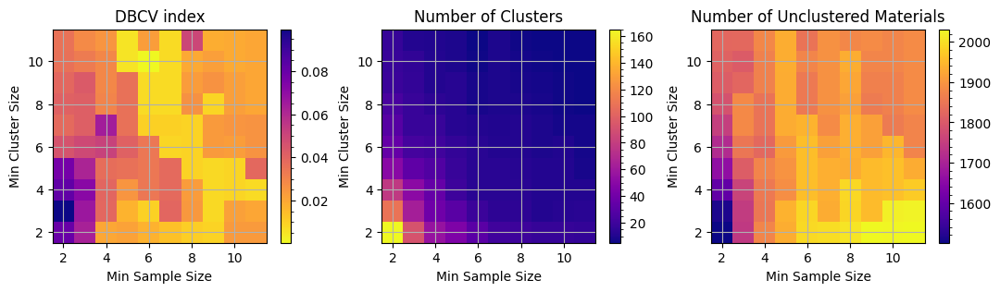

In [14]:
import matplotlib as mpl
# generate plots
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(13, 3), ncols=3)


# plot just the positive data and save the
# color "mappable" object returned by ax1.imshow
pos = ax1.imshow(DBCV_vals, extent=[1.5,11.5,1.5,11.5], cmap=mpl.colormaps["plasma_r"])

# add the colorbar using the figure's method,
# telling which mappable we're talking about and
# which axes object it should be near
cbar3 = fig.colorbar(pos, ax=ax1)

# repeat everything above for the negative data
# you can specify location, anchor and shrink the colorbar
neg = ax2.imshow(N_cluster_vals, extent=[1.5,11.5,1.5,11.5], cmap=mpl.colormaps["plasma"])
cbar2 = fig.colorbar(neg, ax=ax2)


# Plot both positive and negative values between +/- 1.2
pos_neg_clipped = ax3.imshow(N_uncluster_vals, extent=[1.5,11.5,1.5,11.5], cmap=mpl.colormaps["plasma"])
# Add minorticks on the colorbar to make it easy to read the
# values off the colorbar.
cbar1 = fig.colorbar(pos_neg_clipped, ax=ax3)
cbar1.minorticks_on()
cbar2.minorticks_on()
cbar3.minorticks_on()

ax1.set_xlabel("Min Sample Size")
ax1.set_ylabel("Min Cluster Size")
ax1.grid()
ax1.set_title("DBCV index")

ax2.set_xlabel("Min Sample Size")
ax2.set_ylabel("Min Cluster Size")
ax2.grid()
ax2.set_title("Number of Clusters")

ax3.set_xlabel("Min Sample Size")
ax3.set_ylabel("Min Cluster Size")
ax3.grid()
ax3.set_title("Number of Unclustered Materials")

plt.savefig("../../../../../paper_plots/corrected_2d_hist_hdbscan_params", dpi=500, bbox_inches="tight")
plt.show()
